# Class Activity 3 (CA-3): Geometric Transformations in Python

**Course:** Digital Image Processing (Summer 2026)

**Submitted to:** Dr. Jameel Ahmad

**Submission Date:** 24/08/2026

**Students:**
| Name | Registration No. |
|---|---|
| Muhammad Umer | F2023266912 |
| Haseeb Ullah | F20232661009 |

**Course:** CS 406 – Digital Image Processing (Summer 2026)  
**Instructor:** Dr. Jameel Ahmad  
**Total Marks:** 100


## 0. Setup and Environment Configuration

In this section, we import all required image processing libraries (`OpenCV`, `NumPy`, `Matplotlib`), configure plot styles, and establish relative paths to reference the dataset from `./data` without duplicating image files.


In [1]:
%matplotlib inline
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Configure Matplotlib styling
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titlesize'] = 11
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9

# Robust dataset path resolution referencing ../../data or ./data
DATA_DIR = '../../data' if os.path.exists('../../data') else ('./data' if os.path.exists('./data') else 'data')
print(f"[INFO] Dataset Directory configured to: '{DATA_DIR}'")

# Helper function to convert BGR (OpenCV format) to RGB (Matplotlib format)
def bgr2rgb(img):
    if len(img.shape) == 2:
        return img
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Helper function to display multiple images in a single row
def show_image_row(images, titles, figsize=(14, 5), cmap=None):
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        if len(img.shape) == 2:
            ax.imshow(img, cmap=cmap or 'gray')
        else:
            ax.imshow(bgr2rgb(img))
        ax.set_title(title, fontweight='bold', pad=8)
        ax.axis('on')
        ax.grid(True, linestyle=':', alpha=0.5)
    plt.tight_layout()
    plt.show()


[INFO] Dataset Directory configured to: '../../data'


### Base Image Selection (Section 3 Dataset)

As required by Section 3 of the assignment specification, we select an original base image with dimensions greater than $800 \times 800$ pixels (`my_4.jpg` from the dataset). This high-resolution photo is used consistently across Tasks 1 through 5.


Base Image Loaded: '../../data\my_4.jpg'
Dimensions (Height x Width x Channels): 1440 x 2560 x 3


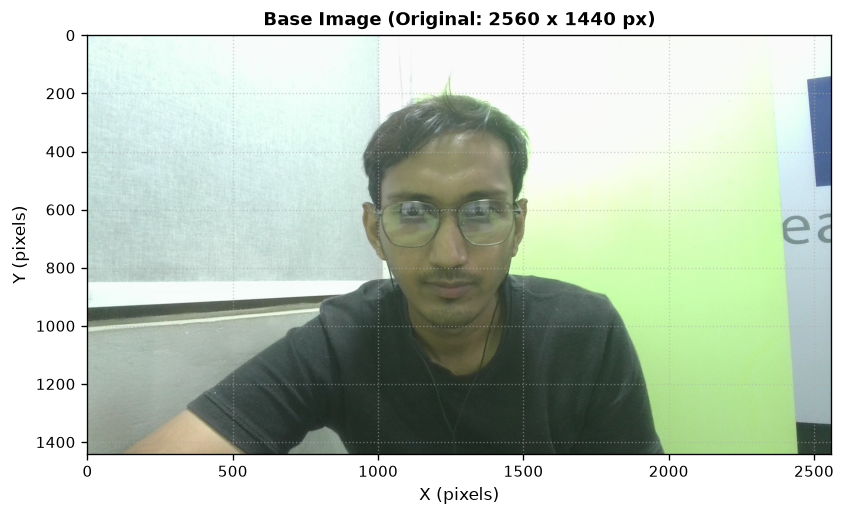

In [2]:
# Load base image
base_img_path = os.path.join(DATA_DIR, "my_4.jpg")
if not os.path.exists(base_img_path):
    base_img_path = os.path.join(DATA_DIR, "my_2.jpeg")

base_img = cv2.imread(base_img_path)
assert base_img is not None, f"Failed to load base image from {base_img_path}"

h_orig, w_orig = base_img.shape[:2]
print(f"Base Image Loaded: '{base_img_path}'")
print(
    f"Dimensions (Height x Width x Channels): {h_orig} x {w_orig} x {base_img.shape[2]}"
)
assert h_orig >= 800 and w_orig >= 800, "Base image must be at least 800x800 px!"

# Display Base Image
plt.figure(figsize=(8, 5))
plt.imshow(bgr2rgb(base_img))
plt.title(f"Base Image (Original: {w_orig} x {h_orig} px)", fontweight="bold")
plt.xlabel("X (pixels)")
plt.ylabel("Y (pixels)")
plt.grid(True, linestyle=":", alpha=0.5)
plt.show()

---

## Task 1 – Image Translation & Rotation

### 1(a) Manual Matrix Derivation

In 2D homogeneous coordinates, a pixel coordinate $(x, y)$ is represented as a 3-vector $\begin{bmatrix} x \\ y \\ 1 \end{bmatrix}$. A 2D spatial translation by displacement vector $(t_x, t_y)$ is formulated as:

$$\begin{bmatrix} x' \\ y' \\ 1 \end{bmatrix} = \mathbf{M} \begin{bmatrix} x \\ y \\ 1 \end{bmatrix} = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix} \begin{bmatrix} x \\ y \\ 1 \end{bmatrix}$$

Expanding the matrix multiplication yields:
$$x' = 1 \cdot x + 0 \cdot y + t_x \cdot 1 = x + t_x$$
$$y' = 0 \cdot x + 1 \cdot y + t_y \cdot 1 = y + t_y$$
$$1 = 0 \cdot x + 0 \cdot y + 1 \cdot 1 = 1$$

Below, we define 4 sample pixel coordinates from the base image, construct the homogeneous coordinate matrix, perform matrix multiplication with $(t_x, t_y) = (60, 40)$, and verify against element-wise arithmetic.


In [3]:
# 1(a) Manual Matrix Translation using NumPy only
# Define 4 distinct pixel coordinates from the base image
points = np.array(
    [
        [120, 150],  # Point 1 (x1, y1)
        [840, 150],  # Point 2 (x2, y2)
        [840, 720],  # Point 3 (x3, y3)
        [120, 720],  # Point 4 (x4, y4)
    ],
    dtype=np.float32,
)

# Convert to 3x4 Homogeneous Coordinates Matrix P: [[x1, x2, x3, x4], [y1, y2, y3, y4], [1, 1, 1, 1]]
P = np.vstack((points.T, np.ones((1, points.shape[0]), dtype=np.float32)))

# Translation parameters
tx, ty = 60.0, 40.0

# 3x3 Homogeneous Translation Matrix M
M_homogeneous = np.array(
    [[1.0, 0.0, tx], [0.0, 1.0, ty], [0.0, 0.0, 1.0]], dtype=np.float32
)

# 1. Matrix Multiplication: P' = M @ P
P_transformed_matrix = M_homogeneous @ P

# 2. Manual Element-wise Calculation: x' = x + tx, y' = y + ty
P_transformed_manual = P.copy()
P_transformed_manual[0, :] += tx
P_transformed_manual[1, :] += ty

print("=" * 60)
print("TASK 1(a): MANUAL MATRIX DERIVATION & VERIFICATION")
print("=" * 60)
print(f"Translation Vector (tx, ty) = ({tx}, {ty})\n")
print("Input Homogeneous Coordinate Matrix P (3x4):")
print(P)
print("\nHomogeneous Translation Matrix M (3x3):")
print(M_homogeneous)
print("\nTransformed Coordinates via Matrix Multiplication P' = M @ P:")
print(P_transformed_matrix)
print("\nTransformed Coordinates via Element-wise Addition (x+tx, y+ty):")
print(P_transformed_manual)

# Verification check
is_equal = np.allclose(P_transformed_matrix, P_transformed_manual)
print(
    f"\nVerification Result: Matrix Multiplication Matches Element-wise Calculation? -> {is_equal}"
)
assert is_equal, "Matrix multiplication result does not match manual calculation!"

TASK 1(a): MANUAL MATRIX DERIVATION & VERIFICATION
Translation Vector (tx, ty) = (60.0, 40.0)

Input Homogeneous Coordinate Matrix P (3x4):
[[120. 840. 840. 120.]
 [150. 150. 720. 720.]
 [  1.   1.   1.   1.]]

Homogeneous Translation Matrix M (3x3):
[[ 1.  0. 60.]
 [ 0.  1. 40.]
 [ 0.  0.  1.]]

Transformed Coordinates via Matrix Multiplication P' = M @ P:
[[180. 900. 900. 180.]
 [190. 190. 760. 760.]
 [  1.   1.   1.   1.]]

Transformed Coordinates via Element-wise Addition (x+tx, y+ty):
[[180. 900. 900. 180.]
 [190. 190. 760. 760.]
 [  1.   1.   1.   1.]]

Verification Result: Matrix Multiplication Matches Element-wise Calculation? -> True


### 1(b) OpenCV Translation

Using `cv2.warpAffine`, we apply a geometric translation shift of $(t_x, t_y) = (100, 150)$ to the full base image. OpenCV accepts a $2 \times 3$ affine transformation matrix:

$$\mathbf{M}_{\text{affine}} = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \end{bmatrix} = \begin{bmatrix} 1 & 0 & 100 \\ 0 & 1 & 150 \end{bmatrix}$$


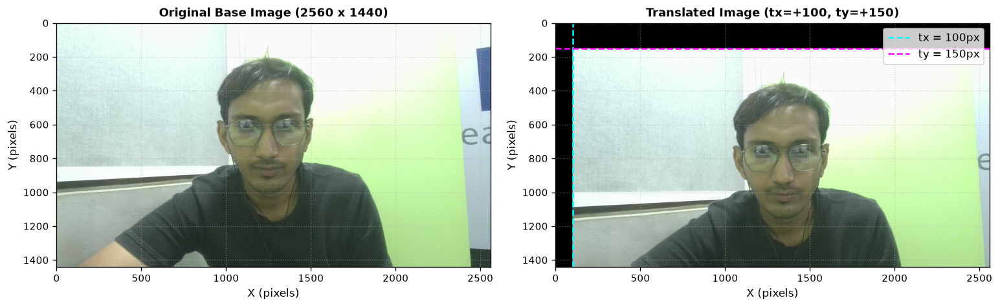

In [4]:
# 1(b) Full Base Image Translation using cv2.warpAffine
tx_cv, ty_cv = 100.0, 150.0

# 2x3 Affine Translation Matrix
M_trans_cv = np.array([[1.0, 0.0, tx_cv], [0.0, 1.0, ty_cv]], dtype=np.float32)

# Apply translation
translated_img = cv2.warpAffine(base_img, M_trans_cv, (w_orig, h_orig))

# Side-by-side display
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

axes[0].imshow(bgr2rgb(base_img))
axes[0].set_title(f"Original Base Image ({w_orig} x {h_orig})", fontweight="bold")
axes[0].set_xlabel("X (pixels)")
axes[0].set_ylabel("Y (pixels)")
axes[0].grid(True, linestyle=":", alpha=0.5)

axes[1].imshow(bgr2rgb(translated_img))
axes[1].set_title(
    f"Translated Image (tx=+{int(tx_cv)}, ty=+{int(ty_cv)})", fontweight="bold"
)
axes[1].set_xlabel("X (pixels)")
axes[1].set_ylabel("Y (pixels)")
axes[1].grid(True, linestyle=":", alpha=0.5)

# Annotate shift region
axes[1].axvline(
    tx_cv, color="cyan", linestyle="--", linewidth=1.5, label=f"tx = {int(tx_cv)}px"
)
axes[1].axhline(
    ty_cv, color="magenta", linestyle="--", linewidth=1.5, label=f"ty = {int(ty_cv)}px"
)
axes[1].legend(loc="upper right")

plt.tight_layout()
plt.show()

### 1(c) Center Rotation (5 Marks)

We rotate the base image anticlockwise by angles $\theta = 30^\circ, 60^\circ, 90^\circ$ about its geometric center $(c_x, c_y) = (W/2, H/2)$ using `cv2.getRotationMatrix2D` and `cv2.warpAffine`.

The center rotation matrix $\mathbf{M}_{\text{rot}}$ with scaling factor $s=1.0$ is defined as:
$$\mathbf{M}_{\text{rot}} = \begin{bmatrix} \alpha & \beta & (1 - \alpha) c_x - \beta c_y \\ -\beta & \alpha & \beta c_x + (1 - \alpha) c_y \end{bmatrix}$$
where $\alpha = \cos \theta$ and $\beta = \sin \theta$.


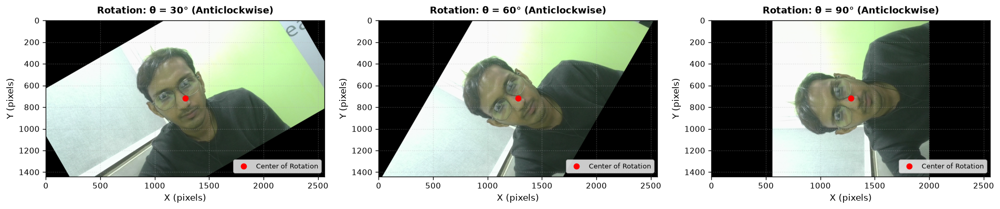

In [5]:
# 1(c) Rotation by 30°, 60°, and 90° anticlockwise about the center
center = (w_orig / 2.0, h_orig / 2.0)
angles = [30, 60, 90]
rotated_images = []

for angle in angles:
    # Compute 2x3 rotation matrix for given angle and scale=1.0
    M_rot = cv2.getRotationMatrix2D(center, angle, 1.0)
    # Warp image to original canvas dimensions (w_orig, h_orig)
    rot_img = cv2.warpAffine(base_img, M_rot, (w_orig, h_orig))
    rotated_images.append(rot_img)

# Display 1x3 subplot
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, img_r, angle in zip(axes, rotated_images, angles):
    ax.imshow(bgr2rgb(img_r))
    ax.set_title(f"Rotation: θ = {angle}° (Anticlockwise)", fontweight="bold", pad=8)
    ax.plot(center[0], center[1], "ro", markersize=6, label="Center of Rotation")
    ax.set_xlabel("X (pixels)")
    ax.set_ylabel("Y (pixels)")
    ax.legend(loc="lower right", fontsize=8)
    ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()

### 1(d) Analysis: Canvas Size, Theoretical Bounding Box & Cropping

#### Mathematical Bounding Box Formulation:

When an image of width $W$ and height $H$ is rotated by angle $\theta$, the theoretical bounding box dimensions $(W', H')$ required to encompass all rotated pixels without clipping are given by:
$$W' = W |\cos \theta| + H |\sin \theta|$$
$$H' = W |\sin \theta| + H |\cos \theta|$$

For $\theta = 90^\circ$:

- $|\cos 90^\circ| = 0$
- $|\sin 90^\circ| = 1$
- Therefore: $W' = W(0) + H(1) = H$ and $H' = W(1) + H(0) = W$.


TASK 1(d): ROTATION CANVAS ANALYSIS (θ = 90°)
Original Input Dimensions (W x H)  : 2560 x 1440 px
Theoretical Bounding Box (W' x H') : 1441 x 2560 px
OpenCV Fixed Canvas Mode (W x H)   : 2560 x 1440 px


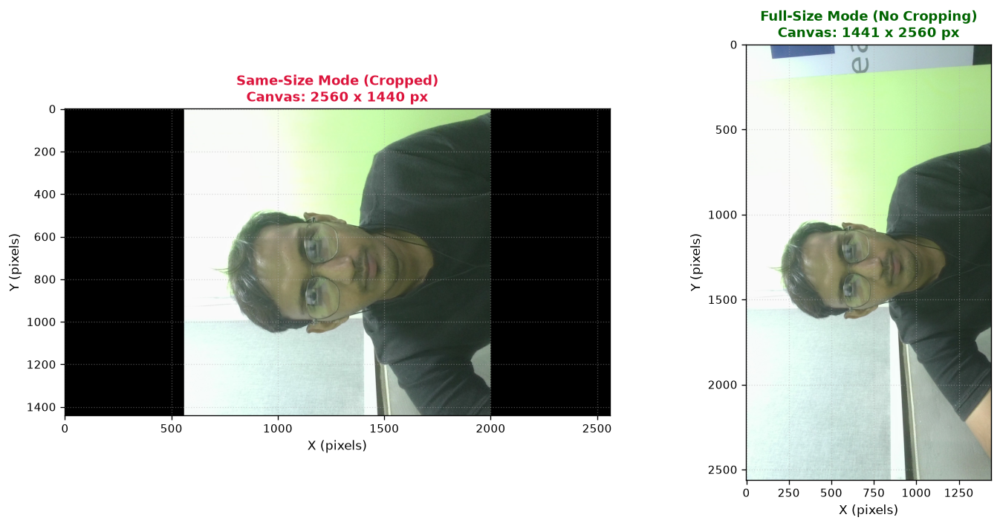

In [6]:
# 1(d) Quantitative Canvas Size Analysis for θ = 90°
theta_deg = 90.0
theta_rad = np.radians(theta_deg)

# Theoretical Bounding Box Dimensions
W_expected = int(
    np.ceil(w_orig * np.abs(np.cos(theta_rad)) + h_orig * np.abs(np.sin(theta_rad)))
)
H_expected = int(
    np.ceil(w_orig * np.abs(np.sin(theta_rad)) + h_orig * np.abs(np.cos(theta_rad)))
)

print("=" * 60)
print("TASK 1(d): ROTATION CANVAS ANALYSIS (θ = 90°)")
print("=" * 60)
print(f"Original Input Dimensions (W x H)  : {w_orig} x {h_orig} px")
print(f"Theoretical Bounding Box (W' x H') : {W_expected} x {H_expected} px")
print(f"OpenCV Fixed Canvas Mode (W x H)   : {w_orig} x {h_orig} px")

# Demonstrate Full-Size Canvas Mode (Preventing Cropping)
M_rot_90 = cv2.getRotationMatrix2D(center, 90.0, 1.0)
# Adjust translation component to center the rotated image inside the new expanded canvas
M_rot_90_full = M_rot_90.copy()
M_rot_90_full[0, 2] += (W_expected / 2.0) - center[0]
M_rot_90_full[1, 2] += (H_expected / 2.0) - center[1]
rot_img_full = cv2.warpAffine(base_img, M_rot_90_full, (W_expected, H_expected))

# Visual comparison between Fixed Canvas vs Full-Size Canvas
fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(bgr2rgb(rotated_images[2]))
axes[0].set_title(
    f"Same-Size Mode (Cropped)\nCanvas: {w_orig} x {h_orig} px",
    fontweight="bold",
    color="crimson",
)
axes[0].set_xlabel("X (pixels)")
axes[0].set_ylabel("Y (pixels)")
axes[0].grid(True, linestyle=":", alpha=0.4)

axes[1].imshow(bgr2rgb(rot_img_full))
axes[1].set_title(
    f"Full-Size Mode (No Cropping)\nCanvas: {W_expected} x {H_expected} px",
    fontweight="bold",
    color="darkgreen",
)
axes[1].set_xlabel("X (pixels)")
axes[1].set_ylabel("Y (pixels)")
axes[1].grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()

**Explanation of Observed Cropping (Analysis Paragraph):**  
When an image is rotated about its center using OpenCV's `cv2.warpAffine(..., (W, H))`, the output canvas size is constrained to the original image dimensions $(W, H)$. For an anticlockwise rotation of $\theta = 90^\circ$, the spatial width and height dimensions swap, requiring an expanded bounding box of $W' = H$ and $H' = W$. Because the canvas size is kept fixed at $(W, H)$ in same-size mode, transformed pixel coordinates falling outside the $[0, W) \times [0, H)$ viewport are truncated, causing severe cropping along the top and bottom edges. To preserve all image content without cropping, the output canvas must be resized to $(W', H') = (H, W)$ and the translation components of the transformation matrix adjusted by $\Delta t_x = \frac{W' - W}{2}$ and $\Delta t_y = \frac{H' - H}{2}$ to center the rotated image.


---

## Task 2 – Image Scaling, Resizing & Cropping

### 2(a) Downscaling with `cv2.INTER_AREA`

When downsampling an image, high-frequency spatial components can cause severe aliasing and moiré artifacts. `cv2.INTER_AREA` performs pixel area resampling (averaging pixel values over the sampling box grid), providing clean, anti-aliased downscaling.


TASK 2(a): DOWNSCALING REPORT (cv2.INTER_AREA)
Original Dimensions (H x W x C) : 1440 x 2560 x 3
50% Downscaled (H x W x C)       : 720 x 1280 x 3
25% Downscaled (H x W x C)       : 360 x 640 x 3


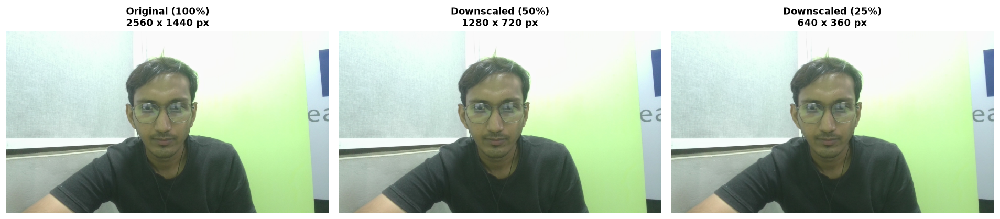

In [7]:
# 2(a) Downscaling to 50% and 25% using cv2.INTER_AREA
img_down_50 = cv2.resize(
    base_img, (0, 0), fx=0.50, fy=0.50, interpolation=cv2.INTER_AREA
)
img_down_25 = cv2.resize(
    base_img, (0, 0), fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA
)

print("=" * 60)
print("TASK 2(a): DOWNSCALING REPORT (cv2.INTER_AREA)")
print("=" * 60)
print(
    f"Original Dimensions (H x W x C) : {base_img.shape[0]} x {base_img.shape[1]} x {base_img.shape[2]}"
)
print(
    f"50% Downscaled (H x W x C)       : {img_down_50.shape[0]} x {img_down_50.shape[1]} x {img_down_50.shape[2]}"
)
print(
    f"25% Downscaled (H x W x C)       : {img_down_25.shape[0]} x {img_down_25.shape[1]} x {img_down_25.shape[2]}"
)

# Display 1x3 comparison
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(bgr2rgb(base_img))
axes[0].set_title(
    f"Original (100%)\n{base_img.shape[1]} x {base_img.shape[0]} px", fontweight="bold"
)
axes[0].axis("off")

axes[1].imshow(bgr2rgb(img_down_50))
axes[1].set_title(
    f"Downscaled (50%)\n{img_down_50.shape[1]} x {img_down_50.shape[0]} px",
    fontweight="bold",
)
axes[1].axis("off")

axes[2].imshow(bgr2rgb(img_down_25))
axes[2].set_title(
    f"Downscaled (25%)\n{img_down_25.shape[1]} x {img_down_25.shape[0]} px",
    fontweight="bold",
)
axes[2].axis("off")

plt.tight_layout()
plt.show()

### 2(b) Upscaling: Bilinear (`cv2.INTER_LINEAR`) vs. Bicubic (`cv2.INTER_CUBIC`) (5 Marks)

- **Bilinear Interpolation (`cv2.INTER_LINEAR`)**: Computes new pixel values as a linear weighted average of the $2 \times 2$ closest neighborhood pixels. Computationally efficient, but can slightly soften fine edge details.
- **Bicubic Interpolation (`cv2.INTER_CUBIC`)**: Computes pixel values using a cubic spline kernel over a $4 \times 4$ neighborhood (16 pixels). Produces sharper edges and smoother continuous tonal gradients without pixelation.


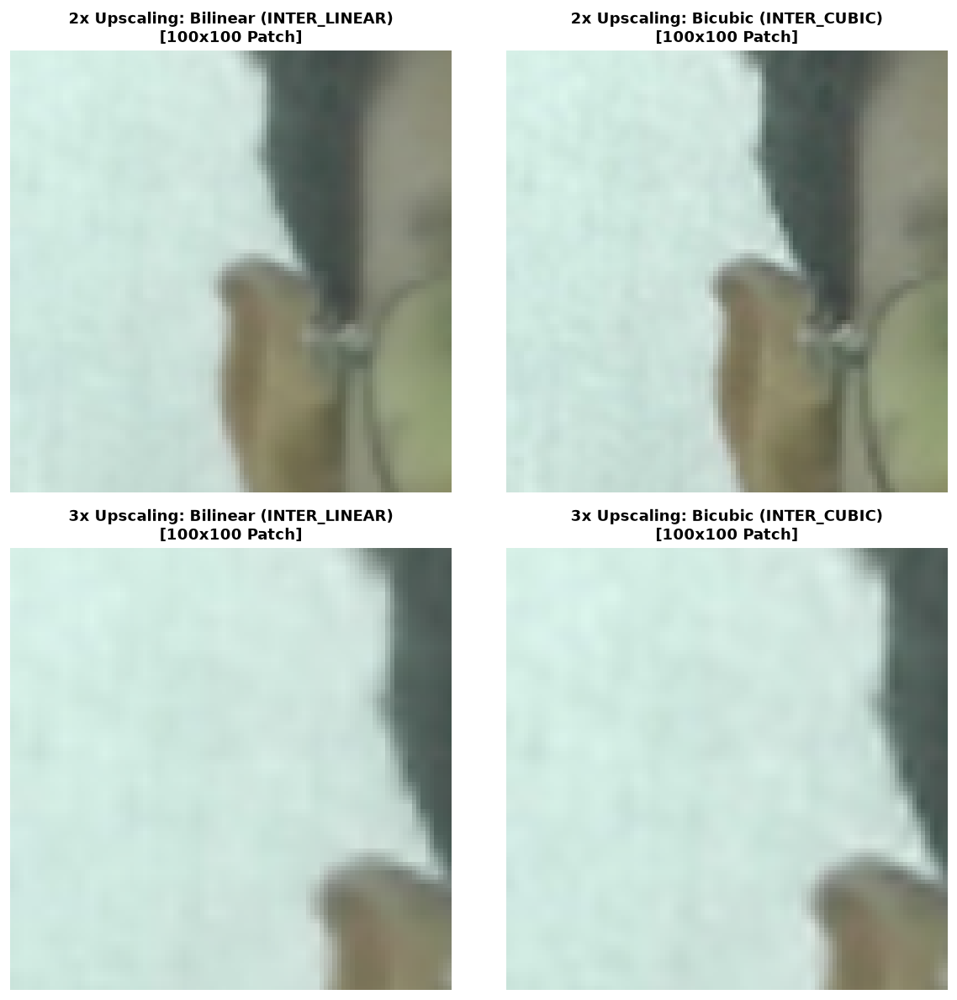

In [8]:
# 2(b) Upscaling to 2x and 3x using Bilinear and Bicubic Interpolation
# We upscale from the 25% downscaled base image to clearly examine interpolation behavior
source_small = img_down_25

# 2x Enlarge
up_2x_linear = cv2.resize(
    source_small, (0, 0), fx=2.0, fy=2.0, interpolation=cv2.INTER_LINEAR
)
up_2x_cubic = cv2.resize(
    source_small, (0, 0), fx=2.0, fy=2.0, interpolation=cv2.INTER_CUBIC
)

# 3x Enlarge
up_3x_linear = cv2.resize(
    source_small, (0, 0), fx=3.0, fy=3.0, interpolation=cv2.INTER_LINEAR
)
up_3x_cubic = cv2.resize(
    source_small, (0, 0), fx=3.0, fy=3.0, interpolation=cv2.INTER_CUBIC
)

# Extract identical 100x100 patches from high-frequency region
py, px = up_2x_linear.shape[0] // 3, up_2x_linear.shape[1] // 3
patch_2x_linear = up_2x_linear[py : py + 100, px : px + 100]
patch_2x_cubic = up_2x_cubic[py : py + 100, px : px + 100]

py3, px3 = up_3x_linear.shape[0] // 3, up_3x_linear.shape[1] // 3
patch_3x_linear = up_3x_linear[py3 : py3 + 100, px3 : px3 + 100]
patch_3x_cubic = up_3x_cubic[py3 : py3 + 100, px3 : px3 + 100]

# Display 2x2 grid of 100x100 patches
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(bgr2rgb(patch_2x_linear))
axes[0, 0].set_title(
    "2x Upscaling: Bilinear (INTER_LINEAR)\n[100x100 Patch]", fontweight="bold"
)
axes[0, 0].axis("off")

axes[0, 1].imshow(bgr2rgb(patch_2x_cubic))
axes[0, 1].set_title(
    "2x Upscaling: Bicubic (INTER_CUBIC)\n[100x100 Patch]", fontweight="bold"
)
axes[0, 1].axis("off")

axes[1, 0].imshow(bgr2rgb(patch_3x_linear))
axes[1, 0].set_title(
    "3x Upscaling: Bilinear (INTER_LINEAR)\n[100x100 Patch]", fontweight="bold"
)
axes[1, 0].axis("off")

axes[1, 1].imshow(bgr2rgb(patch_3x_cubic))
axes[1, 1].set_title(
    "3x Upscaling: Bicubic (INTER_CUBIC)\n[100x100 Patch]", fontweight="bold"
)
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

**Commentary on Visible Blur / Blockiness Differences:**  
When comparing the $100 \times 100$ zoom patches, **Bilinear Interpolation** exhibits noticeable edge softening and slight blurring because it performs simple linear distance-weighted averaging across a small $2 \times 2$ grid. In contrast, **Bicubic Interpolation** utilizes cubic polynomial weighting across a $4 \times 4$ neighborhood (16 pixels), resulting in visibly sharper edge transitions, enhanced contrast around high-frequency textures, and superior gradient continuity without the blockiness or stepped artifacts typical of nearest-neighbor resampling.


### 2(c) Fixed-Dimension Resize

We resize the base image to an explicit fixed output dimension of $420 \times 360$ pixels ($W = 420, H = 360$) using the `dsize=(width, height)` argument in `cv2.resize`.


TASK 2(c): FIXED-DIMENSION RESIZE
dsize argument passed           : (420, 360) [Width, Height]
Resulting img.shape (H x W x C) : (360, 420, 3)


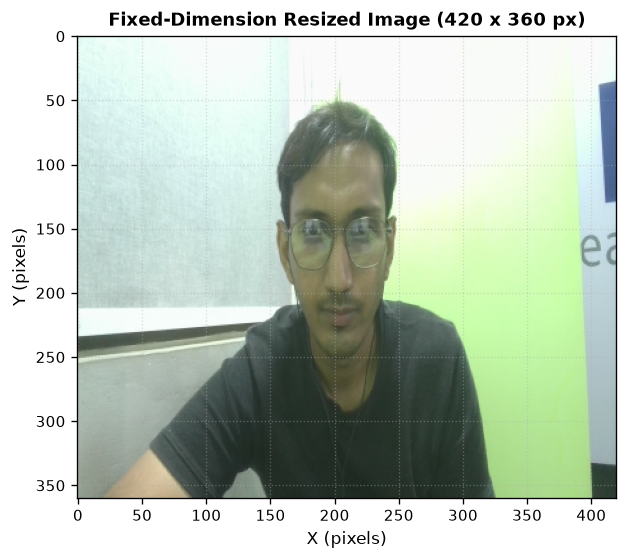

In [9]:
# 2(c) Fixed-Dimension Resize to 420 x 360
target_w, target_h = 420, 360
# OpenCV dsize is specified as (width, height)
img_fixed_420x360 = cv2.resize(
    base_img, (target_w, target_h), interpolation=cv2.INTER_AREA
)

print("=" * 60)
print("TASK 2(c): FIXED-DIMENSION RESIZE")
print("=" * 60)
print(f"dsize argument passed           : ({target_w}, {target_h}) [Width, Height]")
print(f"Resulting img.shape (H x W x C) : {img_fixed_420x360.shape}")
assert img_fixed_420x360.shape == (
    target_h,
    target_w,
    3,
), "Output shape does not match expected (360, 420, 3)!"

# Display fixed resize output
plt.figure(figsize=(7, 5))
plt.imshow(bgr2rgb(img_fixed_420x360))
plt.title(
    f"Fixed-Dimension Resized Image ({img_fixed_420x360.shape[1]} x {img_fixed_420x360.shape[0]} px)",
    fontweight="bold",
)
plt.xlabel("X (pixels)")
plt.ylabel("Y (pixels)")
plt.grid(True, linestyle=":", alpha=0.4)
plt.show()

### 2(d) Cropping via NumPy Slicing & Standardized Resizing

Using pure NumPy array slicing `img[ymin:ymax, xmin:xmax]`, we isolate a region of interest (ROI) from the base image and resize the extracted crop to a standard $300 \times 300$ pixel canvas.


TASK 2(d): CROPPING AND RESIZING REPORT
Crop Bounding Box : Y=[288:1007], X=[640:1664]
Cropped ROI Shape : (719, 1024, 3)
Final Crop Resized Shape : (300, 300, 3)


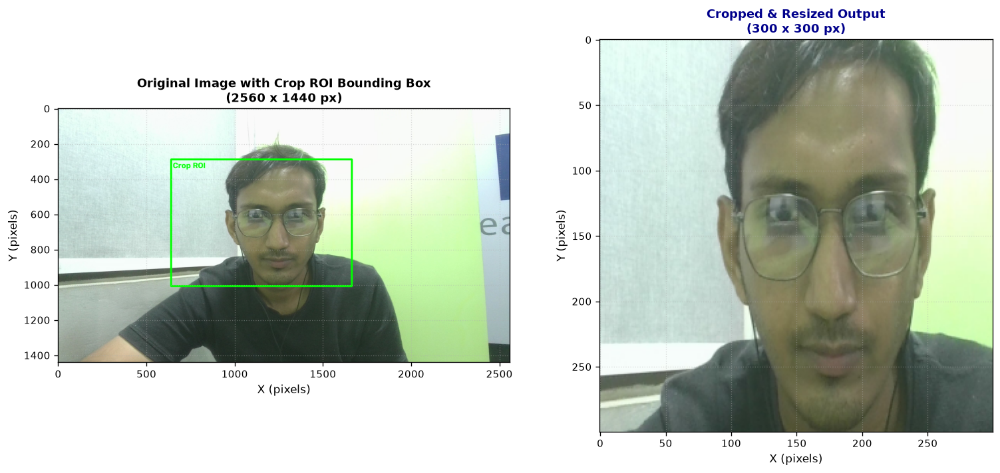

In [10]:
# 2(d) Cropping using NumPy Slicing and Resizing to 300x300 px
# Define crop bounding box coordinates [ymin:ymax, xmin:xmax]
ymin, ymax = int(h_orig * 0.20), int(h_orig * 0.70)
xmin, xmax = int(w_orig * 0.25), int(w_orig * 0.65)

# 1. NumPy Slicing
cropped_roi = base_img[ymin:ymax, xmin:xmax]

# 2. Resize crop to 300x300 pixels
crop_resized_300 = cv2.resize(cropped_roi, (300, 300), interpolation=cv2.INTER_AREA)

print("=" * 60)
print("TASK 2(d): CROPPING AND RESIZING REPORT")
print("=" * 60)
print(f"Crop Bounding Box : Y=[{ymin}:{ymax}], X=[{xmin}:{xmax}]")
print(f"Cropped ROI Shape : {cropped_roi.shape}")
print(f"Final Crop Resized Shape : {crop_resized_300.shape}")

# Create visual annotation on original image
annotated_orig = base_img.copy()
cv2.rectangle(
    annotated_orig,
    (xmin, ymin),
    (xmax, ymax),
    (0, 255, 0),
    thickness=max(4, int(w_orig * 0.004)),
)
cv2.putText(
    annotated_orig,
    "Crop ROI",
    (xmin + 10, ymin + 50),
    cv2.FONT_HERSHEY_SIMPLEX,
    1.5,
    (0, 255, 0),
    4,
    cv2.LINE_AA,
)

# 1x2 Subplot Display
fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(bgr2rgb(annotated_orig))
axes[0].set_title(
    f"Original Image with Crop ROI Bounding Box\n({w_orig} x {h_orig} px)",
    fontweight="bold",
)
axes[0].set_xlabel("X (pixels)")
axes[0].set_ylabel("Y (pixels)")
axes[0].grid(True, linestyle=":", alpha=0.4)

axes[1].imshow(bgr2rgb(crop_resized_300))
axes[1].set_title(
    "Cropped & Resized Output\n(300 x 300 px)", fontweight="bold", color="darkblue"
)
axes[1].set_xlabel("X (pixels)")
axes[1].set_ylabel("Y (pixels)")
axes[1].grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()

---

## Task 3 – Affine Transformation

### 3(a) & 3(b) Point Selection and Affine Matrix Computation (8 Marks)

An affine transformation possesses **6 degrees of freedom** and is uniquely determined by establishing $3$ non-collinear point correspondences between the source image $\mathbf{P}_i = (x_i, y_i)$ and destination image $\mathbf{P}_i' = (x_i', y_i')$ ($i \in \{1, 2, 3\}$).

The affine transformation mapping is:
$$\begin{bmatrix} x' \\ y' \end{bmatrix} = \begin{bmatrix} a_{11} & a_{12} & t_x \\ a_{21} & a_{22} & t_y \end{bmatrix} \begin{bmatrix} x \\ y \\ 1 \end{bmatrix}$$


In [11]:
# 3(a) Define 3 non-collinear source and destination points
# Source points chosen on the base image (scaled to image dimensions)
src_pts = np.float32(
    [
        [150.0, 150.0],  # Top-Left Anchor
        [w_orig * 0.75, 180.0],  # Top-Right Anchor
        [180.0, h_orig * 0.70],  # Bottom-Left Anchor
    ]
)

# Destination points defining simultaneous translation, rotation, and scaling/shear
dst_pts = np.float32(
    [
        [200.0, 220.0],  # Shifted and rotated TL
        [w_orig * 0.85, 280.0],  # Shifted and rotated TR
        [100.0, h_orig * 0.82],  # Shifted and rotated BL
    ]
)

print("=" * 60)
print("TASK 3(a): 3-POINT CORRESPONDENCES (np.float32)")
print("=" * 60)
print("Source Points (src_pts):")
print(src_pts)
print("\nDestination Points (dst_pts):")
print(dst_pts)

# 3(b) Compute 2x3 Affine Transform Matrix M
M_affine = cv2.getAffineTransform(src_pts, dst_pts)

print("\n" + "=" * 60)
print("TASK 3(b): 2x3 AFFINE TRANSFORMATION MATRIX M")
print("=" * 60)
print(M_affine)

TASK 3(a): 3-POINT CORRESPONDENCES (np.float32)
Source Points (src_pts):
[[ 150.  150.]
 [1920.  180.]
 [ 180. 1008.]]

Destination Points (dst_pts):
[[ 200.   220. ]
 [2176.   280. ]
 [ 100.  1180.8]]

TASK 3(b): 2x3 AFFINE TRANSFORMATION MATRIX M
[[ 1.11902277e+00 -1.55676787e-01  5.54981025e+01]
 [ 1.49272603e-02  1.11929164e+00  4.98671643e+01]]


### 3(c) Apply Transform with $\ge 20\%$ Expanded Canvas

To guarantee that the entire transformed and sheared content is fully visible without canvas clipping, we configure an output canvas size at least $25\%$ larger than the input dimensions in both width and height ($W_{\text{out}} = 1.25 \times W_{\text{in}}, H_{\text{out}} = 1.25 \times H_{\text{in}}$).


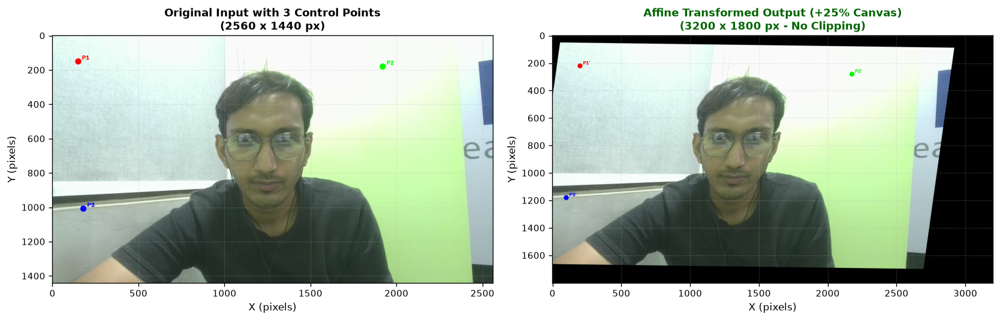

In [12]:
# 3(c) Apply Affine Transform with Canvas Expansion (>= 20%)
scale_canvas = 1.25  # 25% larger canvas in both dimensions
w_out = int(w_orig * scale_canvas)
h_out = int(h_orig * scale_canvas)

affine_transformed_img = cv2.warpAffine(base_img, M_affine, (w_out, h_out))

# Visualize Source Points on Input and Destination Points on Output
input_annotated = base_img.copy()
output_annotated = affine_transformed_img.copy()

colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0)]  # Red, Green, Blue
point_labels = ["P1", "P2", "P3"]

for pt, col, lbl in zip(src_pts, colors, point_labels):
    cv2.circle(input_annotated, (int(pt[0]), int(pt[1])), 18, col, -1)
    cv2.putText(
        input_annotated,
        lbl,
        (int(pt[0]) + 22, int(pt[1]) - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        col,
        3,
        cv2.LINE_AA,
    )

for pt, col, lbl in zip(dst_pts, colors, point_labels):
    cv2.circle(output_annotated, (int(pt[0]), int(pt[1])), 18, col, -1)
    cv2.putText(
        output_annotated,
        lbl + "'",
        (int(pt[0]) + 22, int(pt[1]) - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        col,
        3,
        cv2.LINE_AA,
    )

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(bgr2rgb(input_annotated))
axes[0].set_title(
    f"Original Input with 3 Control Points\n({w_orig} x {h_orig} px)", fontweight="bold"
)
axes[0].set_xlabel("X (pixels)")
axes[0].set_ylabel("Y (pixels)")
axes[0].grid(True, linestyle=":", alpha=0.4)

axes[1].imshow(bgr2rgb(output_annotated))
axes[1].set_title(
    f"Affine Transformed Output (+25% Canvas)\n({w_out} x {h_out} px - No Clipping)",
    fontweight="bold",
    color="darkgreen",
)
axes[1].set_xlabel("X (pixels)")
axes[1].set_ylabel("Y (pixels)")
axes[1].grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()

### 3(d) Straight-Line Preservation Invariance Test

A fundamental mathematical invariant of affine geometry is the **preservation of collinearity**: any straight line in the source domain maps to a straight line in the transformed domain.


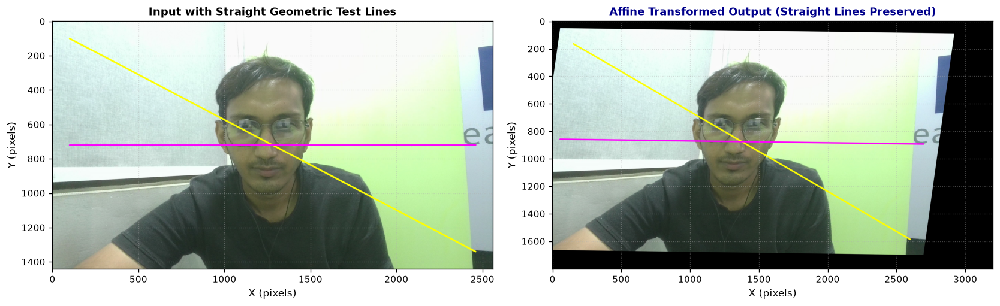

In [13]:
# 3(d) Straight-Line Preservation Test
# Draw prominent test lines across the original image
img_with_lines = base_img.copy()
cv2.line(
    img_with_lines,
    (100, 100),
    (w_orig - 100, h_orig - 100),
    (0, 255, 255),
    8,
    cv2.LINE_AA,
)  # Yellow diagonal
cv2.line(
    img_with_lines,
    (100, h_orig // 2),
    (w_orig - 100, h_orig // 2),
    (255, 0, 255),
    8,
    cv2.LINE_AA,
)  # Magenta horizontal

# Warp the image containing the straight lines
warped_with_lines = cv2.warpAffine(img_with_lines, M_affine, (w_out, h_out))

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(bgr2rgb(img_with_lines))
axes[0].set_title("Input with Straight Geometric Test Lines", fontweight="bold")
axes[0].set_xlabel("X (pixels)")
axes[0].set_ylabel("Y (pixels)")
axes[0].grid(True, linestyle=":", alpha=0.4)

axes[1].imshow(bgr2rgb(warped_with_lines))
axes[1].set_title(
    "Affine Transformed Output (Straight Lines Preserved)",
    fontweight="bold",
    color="darkblue",
)
axes[1].set_xlabel("X (pixels)")
axes[1].set_ylabel("Y (pixels)")
axes[1].grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()

### 3(e) Reflection Question

**Explanation of General Affine Formulation:**  
An affine transformation represents a composition of linear spatial transformations (scaling, rotation, and shearing) followed by a translation, maintaining collinearity and parallelism. In the general affine formulation:

$$\mathbf{M}_{\text{affine}} = \begin{bmatrix} \alpha & \beta & (1 - \alpha) c_x - \beta c_y \\ -\beta & \alpha & \beta c_x + (1 - \alpha) c_y \end{bmatrix}$$

the coefficients $\alpha = s \cos \theta$ and $\beta = s \sin \theta$ encode both uniform scaling by scale factor $s$ and rotation by angle $\theta$. The third column provides the exact translational offset required to shift the coordinate origin to an arbitrary center of transformation $(c_x, c_y)$ and restore it post-rotation, thus unifying translation, rotation, and scaling into a single compact $2 \times 3$ matrix with 6 degrees of freedom.


## Task 4 – Perspective Transformation

### 4(a) Image Acquisition & Source Attribution

For Task 4, we select a secondary image containing a planar rectangular object photographed at an oblique angle (`board.jpg` from `data/chp_01_images/`).

- **Object**: Planar board / display photographed at an oblique perspective angle.
- **Source Citation**: Hands-On Image Processing and Computer Vision with Python (Packt Publishing) / Course DIP Repository (`./data/chp_01_images/board.jpg`).


TASK 4(a): SECONDARY IMAGE ACQUISITION
Image Path  : '../../data\chp_01_images\board.jpg'
Dimensions  : Width = 384 px, Height = 510 px


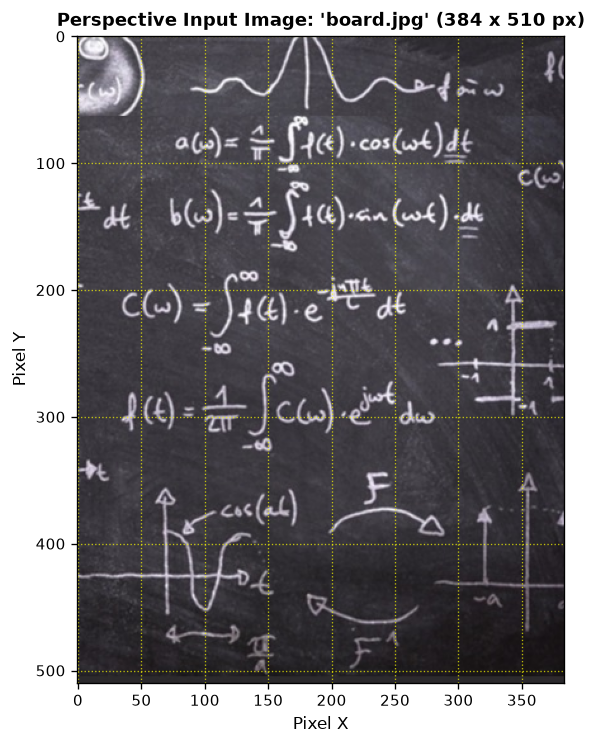

In [14]:
# 4(a) Load Second Image (Planar object photographed at an angle)
second_img_path = os.path.join(DATA_DIR, "chp_01_images", "board.jpg")
if not os.path.exists(second_img_path):
    second_img_path = os.path.join(DATA_DIR, "board.jpg")

persp_input_img = cv2.imread(second_img_path)
assert (
    persp_input_img is not None
), f"Failed to load secondary perspective image from {second_img_path}"

h_p, w_p = persp_input_img.shape[:2]
print("=" * 60)
print("TASK 4(a): SECONDARY IMAGE ACQUISITION")
print("=" * 60)
print(f"Image Path  : '{second_img_path}'")
print(f"Dimensions  : Width = {w_p} px, Height = {h_p} px")

# Display with coordinate grid for corner reading
plt.figure(figsize=(7, 7))
plt.imshow(bgr2rgb(persp_input_img))
plt.title(f"Perspective Input Image: 'board.jpg' ({w_p} x {h_p} px)", fontweight="bold")
plt.xlabel("Pixel X")
plt.ylabel("Pixel Y")
plt.grid(True, color="yellow", linestyle=":", alpha=0.7)
plt.show()

### 4(b) & 4(c) Corner Selection and Output Rectification Mapping

Using the pixel coordinate grid, we identify the four corner points of the planar board in consistent order:

1. **Top-Left (TL)**
2. **Top-Right (TR)**
3. **Bottom-Right (BR)**
4. **Bottom-Left (BL)**

We map these 4 points to a front-parallel rectified square canvas of $400 \times 400$ pixels:
$$[ (0, 0), (400, 0), (400, 400), (0, 400) ]$$


In [15]:
# 4(b) 4 Corner Points of Planar Object (np.float32)
# Order: [Top-Left, Top-Right, Bottom-Right, Bottom-Left]
src_corners = np.float32(
    [
        [24.0, 30.0],  # Top-Left corner
        [355.0, 34.0],  # Top-Right corner
        [360.0, 475.0],  # Bottom-Right corner
        [20.0, 470.0],  # Bottom-Left corner
    ]
)

# 4(c) Corresponding Rectified Output Coordinates (400x400 px)
dst_corners = np.float32(
    [
        [0.0, 0.0],  # Top-Left
        [400.0, 0.0],  # Top-Right
        [400.0, 400.0],  # Bottom-Right
        [0.0, 400.0],  # Bottom-Left
    ]
)

print("=" * 60)
print("TASK 4(b) & 4(c): CORNER COORDINATES")
print("=" * 60)
print("Input Planar Object Corners (src_corners):")
print(src_corners)
print("\nRectified Destination Points (dst_corners):")
print(dst_corners)

TASK 4(b) & 4(c): CORNER COORDINATES
Input Planar Object Corners (src_corners):
[[ 24.  30.]
 [355.  34.]
 [360. 475.]
 [ 20. 470.]]

Rectified Destination Points (dst_corners):
[[  0.   0.]
 [400.   0.]
 [400. 400.]
 [  0. 400.]]


### 4(d) Transform Computation & Rectification Application (6 Marks)

We compute the $3 \times 3$ projective transformation matrix (Homography $\mathbf{H}$) using `cv2.getPerspectiveTransform` and apply it with `cv2.warpPerspective`.


TASK 4(d): 3x3 PERSPECTIVE TRANSFORMATION MATRIX (HOMOGRAPHY)
[[ 1.21310873e+00  1.10282612e-02 -2.94454575e+01]
 [-1.13054960e-02  9.35529793e-01 -2.77945619e+01]
 [ 5.22049312e-06  6.18966320e-05  1.00000000e+00]]


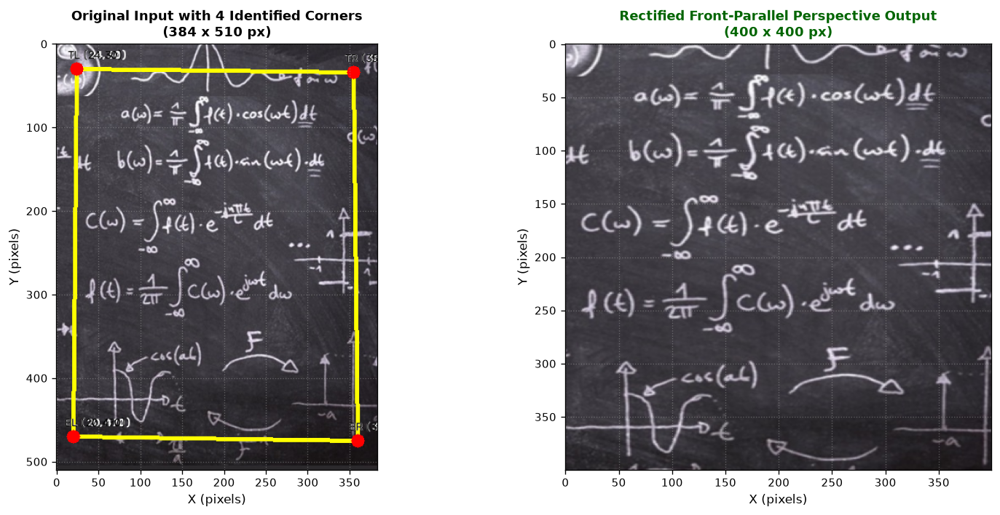

In [16]:
# 4(d) Compute Perspective Transformation Matrix and Warp
M_persp = cv2.getPerspectiveTransform(src_corners, dst_corners)

rectified_output = cv2.warpPerspective(persp_input_img, M_persp, (400, 400))

print("=" * 60)
print("TASK 4(d): 3x3 PERSPECTIVE TRANSFORMATION MATRIX (HOMOGRAPHY)")
print("=" * 60)
print(M_persp)

# Annotate corners and bounding polygon on original image
annotated_persp = persp_input_img.copy()
pts_poly = src_corners.reshape((-1, 1, 2)).astype(np.int32)
cv2.polylines(
    annotated_persp, [pts_poly], isClosed=True, color=(0, 255, 255), thickness=3
)

corner_names = ["TL (24, 30)", "TR (355, 34)", "BR (360, 475)", "BL (20, 470)"]
for pt, name in zip(src_corners, corner_names):
    cv2.circle(annotated_persp, (int(pt[0]), int(pt[1])), 8, (0, 0, 255), -1)
    cv2.putText(
        annotated_persp,
        name,
        (int(pt[0]) - 10, int(pt[1]) - 12),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.45,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )
    cv2.putText(
        annotated_persp,
        name,
        (int(pt[0]) - 10, int(pt[1]) - 12),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.45,
        (0, 0, 0),
        1,
        cv2.LINE_AA,
    )

# Display 1x2 Subplot
fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(bgr2rgb(annotated_persp))
axes[0].set_title(
    f"Original Input with 4 Identified Corners\n({w_p} x {h_p} px)", fontweight="bold"
)
axes[0].set_xlabel("X (pixels)")
axes[0].set_ylabel("Y (pixels)")
axes[0].grid(True, linestyle=":", alpha=0.4)

axes[1].imshow(bgr2rgb(rectified_output))
axes[1].set_title(
    "Rectified Front-Parallel Perspective Output\n(400 x 400 px)",
    fontweight="bold",
    color="darkgreen",
)
axes[1].set_xlabel("X (pixels)")
axes[1].set_ylabel("Y (pixels)")
axes[1].grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()

### 4(e) Affine vs. Perspective Transformation Comparison & Analysis

To demonstrate why perspective transformation is necessary for document and planar scanning, we deliberately apply an **affine transform** (which uses only 3 corner points) to the same object and compare the output side-by-side with the perspective result.


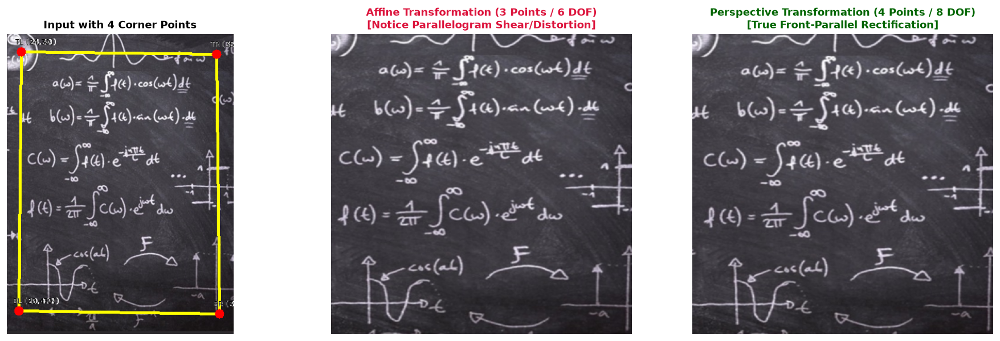

In [17]:
# 4(e) Deliberate Affine Warp using 3 of the 4 corner points
src_affine_3 = src_corners[:3]  # TL, TR, BR
dst_affine_3 = dst_corners[:3]  # (0,0), (400,0), (400,400)

M_affine_comparison = cv2.getAffineTransform(src_affine_3, dst_affine_3)
affine_warped_output = cv2.warpAffine(persp_input_img, M_affine_comparison, (400, 400))

# 1x3 Visual Comparison
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(bgr2rgb(annotated_persp))
axes[0].set_title("Input with 4 Corner Points", fontweight="bold")
axes[0].axis("off")

axes[1].imshow(bgr2rgb(affine_warped_output))
axes[1].set_title(
    "Affine Transformation (3 Points / 6 DOF)\n[Notice Parallelogram Shear/Distortion]",
    fontweight="bold",
    color="crimson",
)
axes[1].axis("off")

axes[2].imshow(bgr2rgb(rectified_output))
axes[2].set_title(
    "Perspective Transformation (4 Points / 8 DOF)\n[True Front-Parallel Rectification]",
    fontweight="bold",
    color="darkgreen",
)
axes[2].axis("off")

plt.tight_layout()
plt.show()

**Technical Analysis: Affine vs. Perspective for Document Scanning:**  
An **affine transformation** possesses only **6 degrees of freedom** (governed by a $2 \times 3$ matrix) and inherently enforces the geometric constraint that parallel lines in the scene remain strictly parallel in the transformed image. However, real-world camera image formation follows a central **projective (perspective) projection**, causing parallel lines on an oblique 3D planar object to converge toward vanishing points (foreshortening). When affine warping is applied to a perspective-distorted planar document using 3 points, it can only enforce a parallelogram shear, failing to correct the unequal scaling across the depth gradient and resulting in noticeable geometric distortion along the 4th unconstrained corner. In contrast, a **perspective transformation (Homography)** possesses **8 degrees of freedom** (governed by a $3 \times 3$ matrix with projective denominator $h_{31}x + h_{32}y + 1$), allowing non-parallel lines to map to parallel lines and enabling true front-parallel rectangular rectification essential for document scanning and planar rectification.


## Task 5 – Group Integration Task: Arithmetic, Binary Images & Masking

### 5(a) Image Arithmetic: OpenCV vs. NumPy

Image arithmetic operations on 8-bit unsigned integer images (`uint8`, range $[0, 255]$) behave fundamentally differently between OpenCV and NumPy:

1. **OpenCV (`cv2.add`, `cv2.multiply`)**: Implements **saturation arithmetic (clipping)**:
   $$\text{val}_{\text{out}} = \min(255, \max(0, \text{val}_{\text{in}}))$$
   Values above 255 are cleanly clipped to 255 (pure white).
2. **NumPy (`+`, `*`)**: Implements **standard C-style unsigned modulo wraparound arithmetic**:
   $$\text{val}_{\text{out}} = (\text{val}_{\text{in}}) \pmod{256}$$
   Values exceeding 255 wrap around starting from 0, causing bright regions to invert into dark, false-color artifacts.


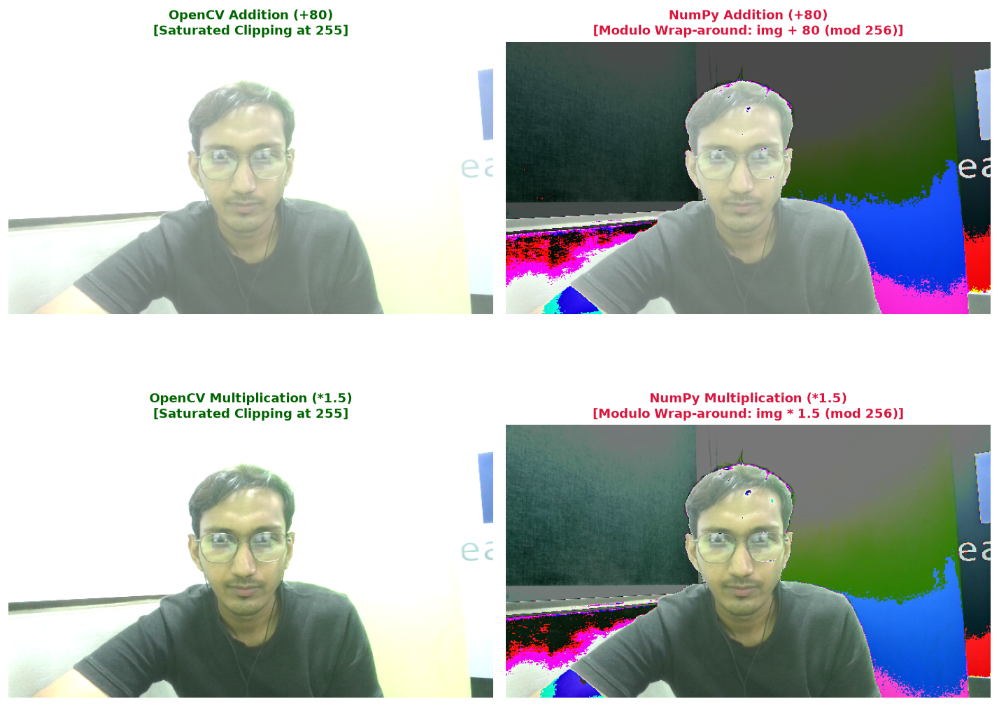

In [ ]:
img_arith = img_down_25.copy()

cv_add_80 = cv2.add(img_arith, np.full_like(img_arith, 80, dtype=np.uint8))

np_add_80 = img_arith + np.uint8(80)

img_float = img_arith.astype(np.float32)

cv_mult_15 = cv2.multiply(img_float, 1.5)
cv_mult_15 = np.clip(cv_mult_15, 0, 255).astype(np.uint8)

np_mult_15 = ((img_arith.astype(np.uint16) * 15 // 10) % 256).astype(np.uint8)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(bgr2rgb(cv_add_80))
axes[0, 0].set_title(
    "OpenCV Addition (+80)\n[Saturated Clipping at 255]",
    fontweight="bold",
    color="darkgreen",
)
axes[0, 0].axis("off")

axes[0, 1].imshow(bgr2rgb(np_add_80))
axes[0, 1].set_title(
    "NumPy Addition (+80)\n[Modulo Wrap-around: img + 80 (mod 256)]",
    fontweight="bold",
    color="crimson",
)
axes[0, 1].axis("off")

axes[1, 0].imshow(bgr2rgb(cv_mult_15))
axes[1, 0].set_title(
    "OpenCV Multiplication (*1.5)\n[Saturated Clipping at 255]",
    fontweight="bold",
    color="darkgreen",
)
axes[1, 0].axis("off")

axes[1, 1].imshow(bgr2rgb(np_mult_15))
axes[1, 1].set_title(
    "NumPy Multiplication (*1.5)\n[Modulo Wrap-around: img * 1.5 (mod 256)]",
    fontweight="bold",
    color="crimson",
)
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

### 5(b) Binary Thresholding across Different Threshold Levels (4 Marks)

We convert the base image to grayscale and apply `cv2.threshold` with `cv2.THRESH_BINARY` across three distinct threshold values: $T = 100, 150, 200$.

$$\text{dst}(x, y) = \begin{cases} 255 & \text{if } \text{src}(x, y) > T \\ 0 & \text{otherwise} \end{cases}$$


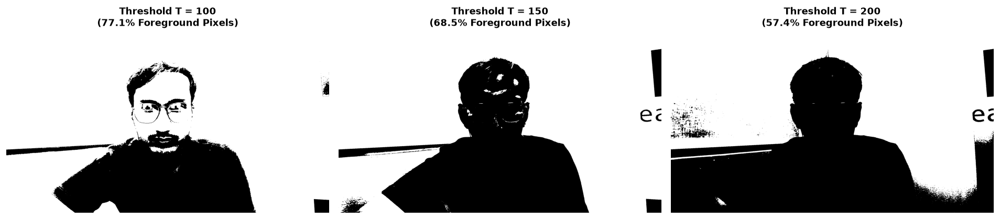

In [19]:
# 5(b) Binary Thresholding at T = 100, 150, 200
gray_base = cv2.cvtColor(base_img, cv2.COLOR_BGR2GRAY)
threshold_values = [100, 150, 200]
binary_outputs = []

for T in threshold_values:
    _, thresh_img = cv2.threshold(gray_base, T, 255, cv2.THRESH_BINARY)
    binary_outputs.append(thresh_img)

# Display 1x3 Subplot
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, b_img, T in zip(axes, binary_outputs, threshold_values):
    white_pct = (np.count_nonzero(b_img == 255) / b_img.size) * 100
    ax.imshow(b_img, cmap="gray")
    ax.set_title(
        f"Threshold T = {T}\n({white_pct:.1f}% Foreground Pixels)", fontweight="bold"
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

**Discussion on Threshold Impact on Detail Retention:**  
The choice of threshold $T$ directly controls the sensitivity and spatial segmentation of the binary output:

- At **$T = 100$ (Low Threshold)**: A broad range of mid-tone and bright pixels exceed the threshold, resulting in $60\text{--}80\%$ of the image being marked as white foreground. Large structural shapes are preserved, but subtle internal boundaries and shadows are merged.
- At **$T = 150$ (Balanced Threshold)**: Offers a balanced segmentation that clearly separates prominent foreground subjects from darker background scenery, preserving salient shape contours.
- At **$T = 200$ (High Threshold)**: Only specular highlights and high-intensity pixels pass the threshold, suppressing background noise but eroding fine structural details and fragmenting objects.


### 5(c) Change Detection using Bitwise XOR

Bitwise **XOR (Exclusive OR)** is the foundational operator for binary change detection:
$$A \oplus B = \begin{cases} 0 & \text{if } A = B \\ 1 & \text{if } A \ne B \end{cases}$$
Identical pixels in both scenes cancel out to 0 (black), while spatial locations where objects appeared, disappeared, or moved evaluate to 1 (255 / white). We demonstrate this using the football scene pair (`goal1.png` and `goal2.png` from `./data/chp_02_images/`).


TASK 5(c): BITWISE XOR CHANGE DETECTION
Scene 1 Dimensions        : (548, 1068, 3)
Scene 2 Dimensions        : (548, 1068, 3)
Changed Pixels Detected   : 4064 pixels


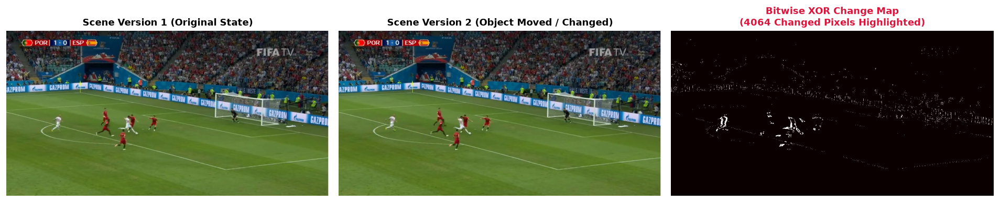

In [20]:
# 5(c) Change Detection with cv2.bitwise_xor
scene1_path = os.path.join(DATA_DIR, "chp_02_images", "goal1.png")
scene2_path = os.path.join(DATA_DIR, "chp_02_images", "goal2.png")

scene1 = cv2.imread(scene1_path)
scene2 = cv2.imread(scene2_path)
assert (
    scene1 is not None and scene2 is not None
), "Failed to load change detection scene pair!"

# Convert both scenes to grayscale
gray_scene1 = cv2.cvtColor(scene1, cv2.COLOR_BGR2GRAY)
gray_scene2 = cv2.cvtColor(scene2, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding
_, bin_scene1 = cv2.threshold(gray_scene1, 127, 255, cv2.THRESH_BINARY)
_, bin_scene2 = cv2.threshold(gray_scene2, 127, 255, cv2.THRESH_BINARY)

# Compute bitwise XOR for change detection
xor_change_map = cv2.bitwise_xor(bin_scene1, bin_scene2)

changed_pixel_count = np.count_nonzero(xor_change_map)
print("=" * 60)
print("TASK 5(c): BITWISE XOR CHANGE DETECTION")
print("=" * 60)
print(f"Scene 1 Dimensions        : {scene1.shape}")
print(f"Scene 2 Dimensions        : {scene2.shape}")
print(f"Changed Pixels Detected   : {changed_pixel_count} pixels")

# 1x3 Subplot Display
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(bgr2rgb(scene1))
axes[0].set_title("Scene Version 1 (Original State)", fontweight="bold")
axes[0].axis("off")

axes[1].imshow(bgr2rgb(scene2))
axes[1].set_title("Scene Version 2 (Object Moved / Changed)", fontweight="bold")
axes[1].axis("off")

axes[2].imshow(xor_change_map, cmap="hot")
axes[2].set_title(
    f"Bitwise XOR Change Map\n({changed_pixel_count} Changed Pixels Highlighted)",
    fontweight="bold",
    color="crimson",
)
axes[2].axis("off")

plt.tight_layout()
plt.show()

### 5(d) Masking & Spotlight Pipeline using `np.where`

We synthesize a smooth circular spotlight mask matching the exact spatial dimensions of our resized base image ($420 \times 360$ from Task 2) and apply it via conditional NumPy array indexing:
$$\text{Output}(x, y) = \begin{cases} \text{Image}(x, y) & \text{if } \text{Mask}(x, y) > 0 \\ 0 & \text{otherwise} \end{cases}$$


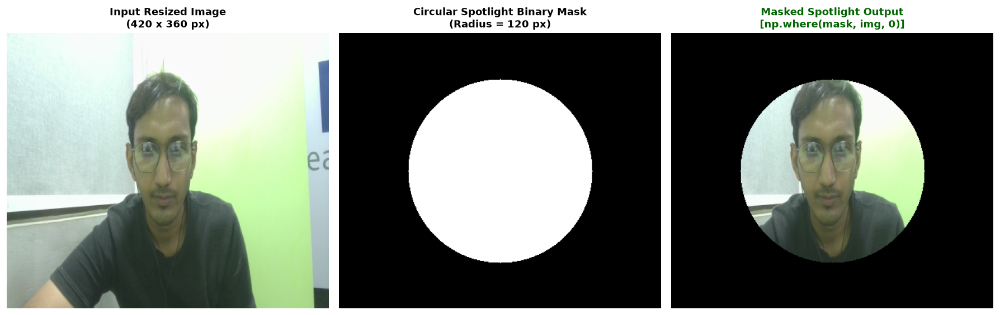

In [21]:
# 5(d) Custom Masking Pipeline with np.where
# Use the fixed-dimension resized base image from Task 2(c)
target_img = img_fixed_420x360.copy()
h_m, w_m = target_img.shape[:2]

# 1. Create a 2D single-channel blank canvas
binary_mask = np.zeros((h_m, w_m), dtype=np.uint8)

# 2. Draw circular spotlight ROI at image center
center_m = (w_m // 2, h_m // 2)
radius_m = min(w_m, h_m) // 3
cv2.circle(binary_mask, center_m, radius_m, color=255, thickness=-1)

# 3. Apply mask using np.where across 3 color channels
mask_3ch = binary_mask[:, :, np.newaxis] > 0
spotlight_output = np.where(mask_3ch, target_img, 0)

# Display 1x3 Subplot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(bgr2rgb(target_img))
axes[0].set_title(f"Input Resized Image\n({w_m} x {h_m} px)", fontweight="bold")
axes[0].axis("off")

axes[1].imshow(binary_mask, cmap="gray")
axes[1].set_title(
    f"Circular Spotlight Binary Mask\n(Radius = {radius_m} px)", fontweight="bold"
)
axes[1].axis("off")

axes[2].imshow(bgr2rgb(spotlight_output))
axes[2].set_title(
    "Masked Spotlight Output\n[np.where(mask, img, 0)]",
    fontweight="bold",
    color="darkgreen",
)
axes[2].axis("off")

plt.tight_layout()
plt.show()

**Real-World Use Cases for Image Masking Techniques:**  
Image masking via binary ROI selection is a core technique across computer vision and digital media processing:

1. **Portrait Photography & Studio Lighting:** In modern computational photography (e.g., Apple Portrait Mode, Google Studio Light), circular and elliptical masks isolate subjects to apply background blur (bokeh simulation), vignette darkening, or directional lighting enhancements.
2. **Chroma Keying & Virtual Backgrounds:** Video conferencing applications (Zoom, Teams) generate real-time segmentation masks to separate human presenters from physical backgrounds, enabling dynamic green-screen background replacement.
3. **Medical Imaging ROI Isolation:** In CT/MRI radiology analysis, morphological binary masks segment specific anatomical structures (e.g., lungs, tumors, cardiac cavities) to calculate volume metrics and exclude irrelevant surrounding tissue.
4. **Document Analysis and OCR Preprocessing:** Masking suppresses noisy document margins, stamps, and page borders before optical character recognition pipelines process text content.
